In [1]:
from cv2.ximgproc import guidedFilter
import cv2
from glob import glob
import numpy as np
from matplotlib import pyplot as plt

def normalize(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))

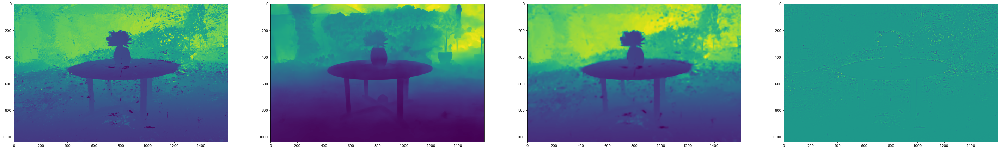

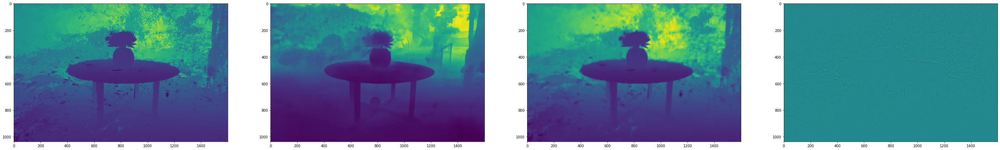

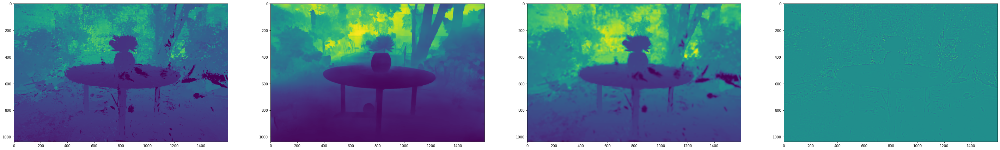

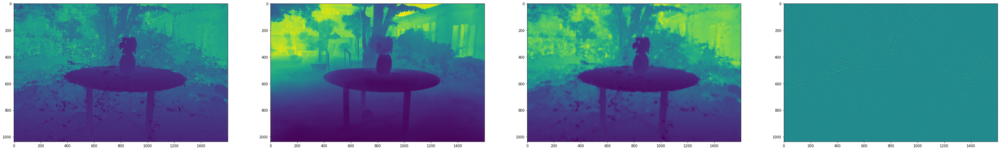

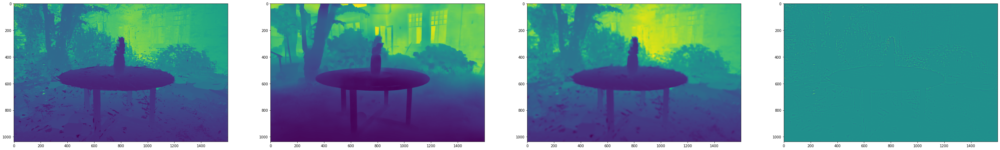

...

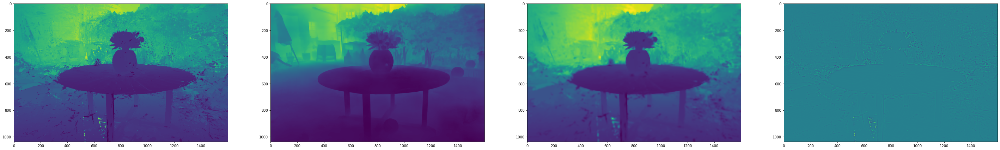

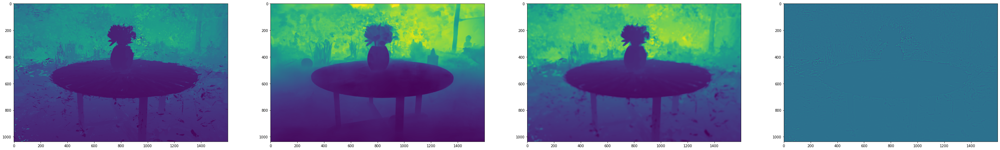

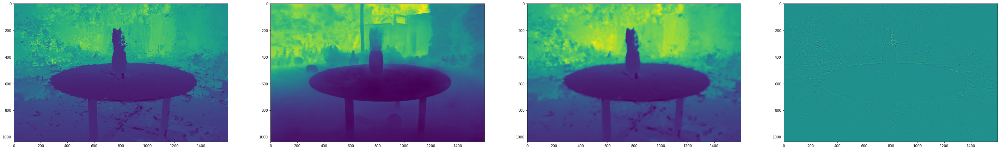

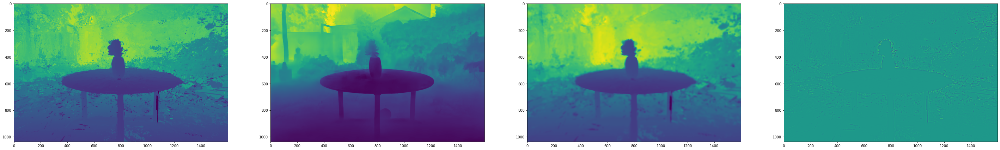

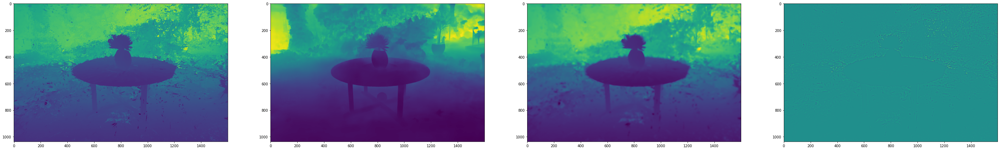

In [3]:
img_folder = 'output/garden_12_test2/train/ours_35000/modes/*.png'
guide_folder = 'data/garden_12/depths/*.npy'

imgs = sorted(glob(img_folder))
imgs = [cv2.imread(x, cv2.IMREAD_ANYDEPTH) for x in imgs]

guides = sorted(glob(guide_folder))
guides = [np.load(x) for x in guides]


for (img, guide) in zip(imgs, guides):
    img = img.astype(np.float32)/(2 ** 16 - 1)
    guide = normalize(guide.astype(np.float32))
    guide = cv2.resize(guide, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_CUBIC)
    #print(img.shape, guide.shape)
    fimg = guidedFilter(guide, img, 5, 1e-3)
    fig = plt.figure(figsize=(50, 10))
    fig.add_subplot(1, 4, 1)
    plt.imshow(img)
    fig.add_subplot(1, 4, 2)
    plt.imshow(guide)
    fig.add_subplot(1, 4, 3)
    plt.imshow(fimg)
    fig.add_subplot(1, 4, 4)
    plt.imshow(img - fimg)
    plt.show()
    
